# Scenario analysis

An essential feature of a model is that when given a specific set of inputs (the exogenous variables to the model) it will always return the same results. 

Below a new `ModelFlow` sessionis prepared, initializing a pandas session and importing and solving a saved WBG model (NB: these are precisely the same commands they used to start the previous chapter) and would form the essential initialization commands of any python session using `ModelFlow`.


In [1]:
# import the model class from modelflow package
from modelclass import model 
import modelmf       # Add useful features to pandas dataframes 
                     # using utlities initially developed for modelflow

model.widescreen()   # These modelflow commands ensure that outputs from modelflow play well with Jupyter Notebook
model.scroll_off()

%load_ext autoreload   
%autoreload 2


#Load a saved version of the Pakistan model and solve it, 
#saving the results in the model object mpak, and the resulting dataframe in bline

#Replace the path below with the location of the pak.pcim file on your computer
mpak,bline = model.modelload('C:\mflow\modelflow-manual\papers\mfbook\content\models\pak.pcim', \
                                alfa=0.7,run=1,keep= 'Baseline')



file read:  C:\mflow\modelflow-manual\papers\mfbook\content\models\pak.pcim


:::{Recall}
The ```model``` object (```mpak``` in this instance) always contains two `DataFrames`, the `.basedf` dataframe that contains the initial values for the variables of the model, and the `.lastdf` which contain the results of the most recently executed scenario.
:::

As noted when, as was the case of the load, the model is solved without changing any inputs the model should return (reproduce) exactly the same data as before[^fn2].  To test this for ```mpak``` we can compare the results from the simulation using the ```basedf``` and ```lastdf``` DataFrames.

[^fn2:] If it does not, the model has violated he principle of reproducibility and there is something wrong (usually one of the identities does not hold).


Below the percent difference between in the values of the variables for real GDP and Consumer demand  in the two `dataframes` `.basedf` and `lastdf` is zero following a simulation where the inputs were not changed is zero.



In [3]:
# Need statement to change the default format
mpak.smpl(2020,2030)
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].difpctlevel.mul100.df



,PAKNYGDPMKTPKN,PAKNECONPRVTKN
2020,0.0,0.0
2021,0.0,0.0
2022,0.0,0.0
2023,0.0,0.0
2024,0.0,0.0
2025,0.0,0.0
2026,0.0,0.0
2027,0.0,0.0
2028,0.0,0.0
2029,0.0,0.0


## Different kinds of simulations

The `modelflow` package performs 4 different kinds of simulation:

1. A shock to an exogenous variable in the model
2. An exogenous shock of a behavioural variable, executed by exogenizing the variable
3. An endogenous shock of a behavioural variable, executed by shocking the add factor of the variable.
4. A mixed shock of a behavioural variable, achieved by temporarily exogenixing the variable.

Although technically modelflow would allow us to shock identities, that would violate their nature as accounting rules so we exclude this possibility. 


### A shock to an exogenous variable

A World Bank model will reproduce the same values if inputs (exogenous variables) are not changed.  In the simulation below we change the oil price increasing it by $25 for the three years between 2025 and 2027 inclusive.

To do this we first create a new input dataframe with the revised data.

Then we use the ```mfcalc``` method to change the value for the three years in question.

Finally we do a but of pandas math to display the initial value, the changed value and the difference between the two, confirming that the mfcalc statement did what we hoped.

In [4]:
#Make a copy of the baseline dataframe
oilshockdf=mpak.basedf
oilshockdf=oilshockdf.mfcalc("<2025 2027> WLDFCRUDE_PETRO = WLDFCRUDE_PETRO +25")

compdf=mpak.basedf.loc[2000:2030,['WLDFCRUDE_PETRO']]
compdf['LASTDF']=oilshockdf.loc[2000:2030,['WLDFCRUDE_PETRO']]
compdf['Dif']=compdf['LASTDF']-compdf['WLDFCRUDE_PETRO']

compdf.loc[2024:2030]



,WLDFCRUDE_PETRO,LASTDF,Dif
2024,80.367180,80.367180,0.0
2025,85.336809,110.336809,25.0
2026,90.613742,115.613742,25.0
2027,96.216983,121.216983,25.0
2028,102.166709,102.166709,0.0
2029,108.484346,108.484346,0.0
2030,115.192643,115.192643,0.0


#### Running the simulation

Having created a new dataframe comprised of all the old data plus the changed data for the oil price we can execute the simulation.  In the command below, the simulation is run from 2020 to 2040, using the oilshockdf as the input dataframe.  The results of the simulation will be put into a new dataframe ```ExogOilSimul```.  The ```Keep``` command ensures that the mpak model object stores (keeps) a copy of the results identified by the text name *'$25 increase in oil prices 2025-27'*.

In [5]:

ExogOilSimul = mpak(oilshockdf,2020,2040,keep='$25 increase in oil prices 2025-27') # simulates the model 

Using the ```modelflow``` visualization tools we can see the impacts of the shock; as a print out; as charts and within Jupyter notebook as an interactive widget.

##### Results

The display below confirms that the shock we wanted to introduce was executed. The `dif.df` method returns the difference between the `.lastdf` and `.basedf` values of the selected variable(s) as a `dataframe`. The with `mpak.set_smpl(2020,2030):` clauses temporarily restricts the sample period over which the following **indented** commands are executed.  Alternatively the `mpak.smpl(2020,2030)`could be used. This would restricts the time period of over which **all** subsequent commands are executed.


In [6]:
with mpak.set_smpl(2020,2030):
    print(mpak['WLDFCRUDE_PETRO'].dif.df);

      WLDFCRUDE_PETRO
2020              0.0
2021              0.0
2022              0.0
2023              0.0
2024              0.0
2025             25.0
2026             25.0
2027             25.0
2028              0.0
2029              0.0
2030              0.0


Below we look at the impact of this change on a few variables, expressed as a percent deviation of the variable from its pre-shock level.

The first variable ```PAKNYGDPMKTPKN``` is Pakistan's real GDP, the second ```PAKNECONPRVTKN``` is real consumption and the third is the Consumer price deflator ```PAKNECONPRVTXN```.



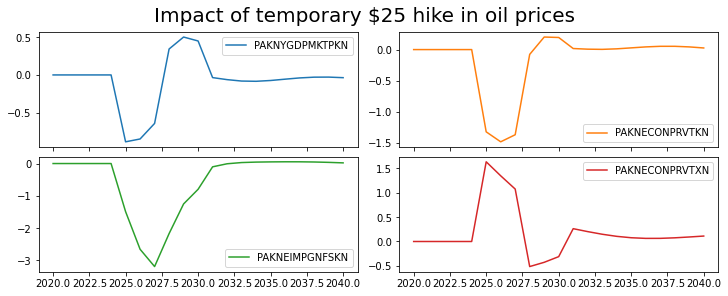

In [7]:
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Impact of temporary $25 hike in oil prices")

In [8]:

print(round(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.df,2))

      PAKNYGDPMKTPKN  PAKNECONPRVTKN  PAKNEIMPGNFSKN  PAKNECONPRVTXN
2020            0.00            0.00            0.00            0.00
2021            0.00            0.00            0.00            0.00
2022            0.00            0.00            0.00            0.00
2023            0.00            0.00            0.00            0.00
2024            0.00            0.00            0.00            0.00
2025           -0.89           -1.32           -1.49            1.64
2026           -0.85           -1.48           -2.65            1.35
2027           -0.64           -1.37           -3.19            1.08
2028            0.34           -0.08           -2.17           -0.51
2029            0.50            0.20           -1.25           -0.43
2030            0.45            0.19           -0.80           -0.31
2031           -0.04            0.02           -0.10            0.26
2032           -0.06            0.01           -0.01            0.20
2033           -0.08            0.


The graphs show the change in the level as a percent of the previous level. They suggest that a temporary $25 oil price hike would reduce GDP in the first year by about 0.9 percent, that the impact would diminish by the third year to -.64 percent, and then turn positive in the fourth year when the price effect was eliminated.  
The negative impact would on household consumption would be stronger but follow a similar pattern.  The reason that the GDP impact is smaller, is partly because of the impact on imports which decline strongly.  Because imports enter into the GDP identity with a negative sign, lower imports actually increase aggregate GDP.

Finally as could be expected prices rise sharply initially with higher oil prices, but as the slow down in growth is felt, inflationary pressures turn negative and the overall impact on the price level turns negative.  The graph and table above shows what is happening to the **price level**. To see the impact on inflation (the rate of growth of prices) requires a separate graph using ```difpct.mul100```, which shows the change in the rate of growth of variables where the growth rate is expressed as a per cent. 

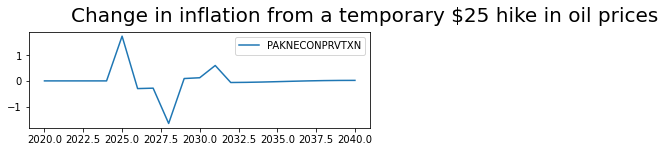

In [9]:
mpak['PAKNECONPRVTXN'].difpct.mul100.plot(title="Change in inflation from a temporary $25 hike in oil prices")

<span style="color:blue"> Ib how come this graph shows up so small.  How can we affect its size?</span>
    
This view, gives a more nuanced result.  Inflation spikes initially by about 1.2 percent, but falls below its pre-shock level as the influence of the slowdown weighs on the lagged effect of higher oil prices. In 2028 when oil prices drop back to their previous level this adds to the dis-inflationary forces in the economy at first, but the boost to demand from lower prices soon translates into an acceleration in growth and higher inflation.



### An exogenous shock to a Behavioural variable 

Behavioural equations can be de-activated by exogenizing them, either for the entire simulation period, or for a selected sub period.  In this example we exogenize consumption for the entire simulation period. 

To motivate the simulation, assume that a change in weather patterns has increased the number of sunny days by 10 percent. This increases households happiness and therefore causes them to permanently increase their spending by 2.5% beginning in 2025.

Such a shock can be specified either manually or use the method ```.fix()```. Below the simpler `.fix()` method is used, but the equivalent manual steps performed by `.fix()` are also explained.

To exogenize `PAKNECONPRVTKN` for the entire simulation period, initially a new `DataFrame` is created as a slightly modified version of  `mpak.basedf`.

`Cfixed=mpak.fix(mpak.basedf,PAKNECONPRVTKN)`

This does two things, that could have been done manually.  First it sets the dummy variable ```PAKNECONPRVTKN_D=1``` for the entire simulation period -- effectively transforming the equation to `PAKNECONPRVTKN=PAKNECONPRVTKN_X`.  Then it sets the variable ```PAKNECONPRVTKN_X``` in the ```Cfixed``` dataframe equal to the value of ```PAKNECONPRVTKN``` in the ```basedf``` `.DataFrame`. All the other variables are  just copies of their values in `.basedf`.

With `PAKNECONPRVTKN_D=1` throughout the normal behavioral equation is effectively de-activated or exogenized.



In [10]:
mpak.smpl() # reset the active sample period to the full model.
Cfixed=mpak.fix(bline,'PAKNECONPRVTKN')

For the moment, the equation is exogenized but the values have been set to the same values as the ```.basedf``` dataframe, so solving the model will not change anything.

The `.upd()` method can be used to implement the assumption that Real consumption (` PAKNECONPRVTYKN`) would be 2.5% stronger.


In [11]:
Cfixed=Cfixed.upd("<2025 2040> PAKNECONPRVTKN_X  * 1.025")

To perform the simulation, the revised `CFixed` DataFrame to the mpak model solve routine.

`CFixedRes = mpak(Cfixed,2020,2040,keep='2.5% increase in C 2025-40') `

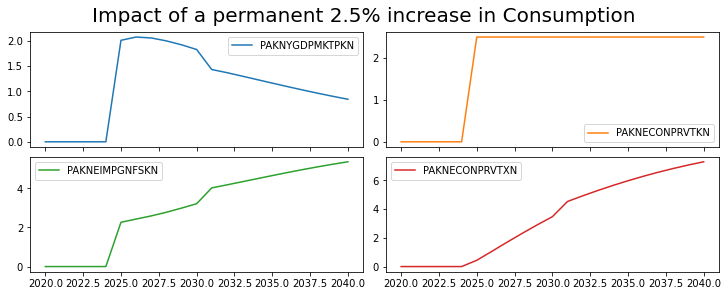

In [12]:
CFixedRes = mpak(Cfixed,2020,2040,keep='2.5% increase in C 2025-40') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Impact of a permanent 2.5% increase in Consumption")


In [13]:
import pandas as pd
with pd.option_context('display.float_format', '{:,.2f}'.format):
    with mpak.set_smpl(2020,2040):
        print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.df)


      PAKNYGDPMKTPKN  PAKNECONPRVTKN  PAKNEIMPGNFSKN  PAKNECONPRVTXN
2020            0.00            0.00            0.00            0.00
2021            0.00            0.00            0.00            0.00
2022            0.00            0.00            0.00            0.00
2023            0.00            0.00            0.00            0.00
2024            0.00            0.00            0.00            0.00
2025            2.01            2.50            2.27            0.44
2026            2.07            2.50            2.43            1.06
2027            2.05            2.50            2.59            1.69
2028            1.99            2.50            2.78            2.31
2029            1.92            2.50            2.99            2.90
2030            1.83            2.50            3.22            3.47
2031            1.43            2.50            4.03            4.53
2032            1.37            2.50            4.18            4.92
2033            1.30            2.

The permanent rise in consumption by 2.5 percent causes a temporary increase in GDP of close to 2% (1.86). Higher imports tend to diminish the effect on GDP, while over time higher prices due to the inflationary pressures caused by the additional demand cause the GDP impact to diminish to close to less than 1 percent by 2040.

### Temporarily exogenize a behavioural variable

The third method of formulating a scenario involves temporarily exogenizing a variable.    The methodology is the same except the period for which the variable is exogenized is different. 

To fully explore the differences in the approaches, three scenarios are executed.  

1. Exogenizes the variable for the whole period, but shock it for three years (2025-2027). Afterwards, the level of consumption falls to (and is frozen at) its pre-shock levels.
2. Exogenizes the variable for the whole period, but shock it for three years (2025-2027). On this occasion the --kg option is used to hold **the growth rates** of the exogenized variable the same in the post-shock period.
3. Exogenizes the variable only for the period during period that the dependent variable is shocked (2025-2027). Afterwards the consumption equation is activated and determines the path of post-shock consumption.

#### Temporary shock exogenized for the whole period

Here the set up is basically the same as before.

mpak.smpl() # reset the active sample period to the full model.
Cfixed=mpak.fix(baseline,'PAKNECONPRVTKN')


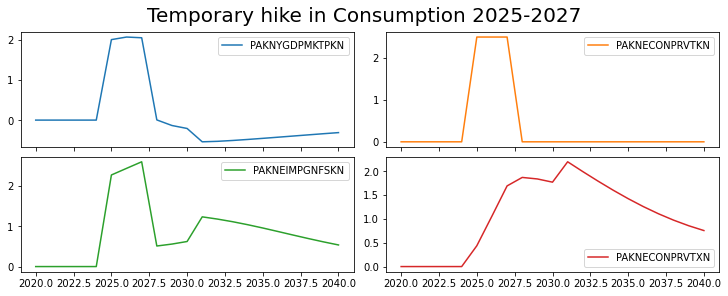

In [14]:
mpak.smpl()                                                            # reset the active sample period to the full model.
CTempExogAll=mpak.fix(bline,'PAKNECONPRVTKN')                          # create a copy of the bline DataFrame, but setting the PAKNECONPRVTKN_D variable to 1 for the period 2025 through 2027
CTempExogAll=CTempExogAll.upd("<2025 2027> PAKNECONPRVTKN_X * 1.025")  # multiply the exogenized value of consumption by 2.5% for 2025 through 2027

#Solve the model
CTempXAllRes = mpak(CTempExogAll,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Temporary hike in Consumption 2025-2027")



The results are quite different.  GDP is boosted initially as before but when consumption drops back to its pre-shock level, GDP and imports decline sharply.

Prices (and inflation) are higher initially but when the economy starts to slow after 2025 prices start to fall (disinflation).



#### Temporary shock exogenized for the whole period

This scenario is the same as the previous, but this time the `--KG` (keep_growth) option is used to maintain the pre-shock growth rates of consumption in the post-shock period.  Effectively this is the same as a permanent increase in the level of consumption by 2.5% because the final shocked value of consumption (which was 2.5% higher then its pre-shock level) is grown at the same pre-shock rate -- ensuring that all post-shock variables are also up by 2.5%.



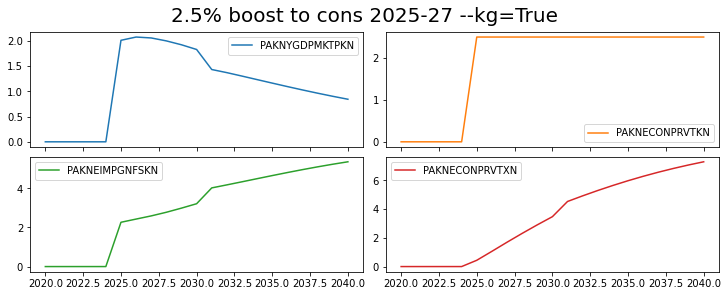

In [15]:
mpak.smpl() # reset the active sample period to the full model.
CTempExogAllKG=mpak.fix(bline,'PAKNECONPRVTKN')
CTempExogAllKG = CTempExogAllKG.upd('''
<2025 2027> PAKNECONPRVTKN_X * 1.025 --kg
''',lprint=0)

#Now we solve the model
CTempXAllResKG = mpak(CTempExogAllKG,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period --keep_growth=True') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="2.5% boost to cons 2025-27 --kg=True")


### Exogenize the variable only for the period during which it is shocked

This is version of our scenario introduces a subtle but import difference.  Here we will exogenize the variable, again using the fix syntax. But this time we will exogonize it only for the period where the variable is shocked.

What this means is that the consumption function will be de-actvated for only three years (instead of the whole period as in the previous examples).  As a result, the values consumption take in 2028, 2029, ... 2040 will depend on the model, not the level it was set to when exogenized (which was the case in the 3 previous versions).



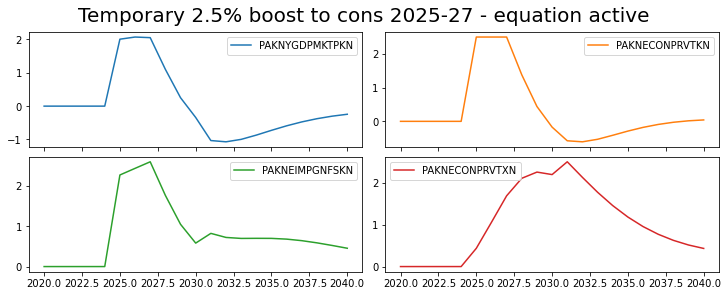

In [16]:
mpak.smpl() # reset the active sample period to the full model.
CExogTemp=mpak.fix(bline,'PAKNECONPRVTKN',2025,2027)                             #Consumption is exogenized only for three years 2025 2026 and 2027 PAKNECONPRVTKN_D=1 for 2025,2026, 2027 0 elsewhere.
CExogTemp = CExogTemp.upd('<2025 2027> PAKNECONPRVTKN_X * 1.025',lprint=0)       #In subsequent years it's level will be determined by the equation 

#Solve the model
CExogTempRes = mpak(CExogTemp,2020,2040,keep='2.5% increase in C 2025-27 -- temporarily exogenized') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Temporary 2.5% boost to cons 2025-27 - equation active")



These results have subtle differences compared with the previous.  The most obvious is visible in looking at the graph for Consumption.  Rather than reverting immediately to its earlier pre-shock level, it falls more gradually, actually overshoots (falls below its earlier level) and then gradually returns to its pre-shock level.  That is because unlike in the previous shocks, its path is being determined endogenously and reacting to changes elsewhere in the model, notably changes to prices, wages and government spending.

In [17]:
print('Consumption base and shock levels\r\n');

print('Real values in 2030');
print(f'Base value:  {bline.loc[2028,"PAKNECONPRVTKN"]:,.0f}.\tShocked value: {CExogTempRes.loc[2028,"PAKNECONPRVTKN"]:,.0f}.\r\n'
    f'Percent difference: {round(100*((CExogTempRes.loc[2030,"PAKNECONPRVTKN"]-bline.loc[2028,"PAKNECONPRVTKN"])/bline.loc[2028,"PAKNECONPRVTKN"]),2)}')
print('\r\nReal values in 2040');
print(f'Base value:  {bline.loc[2040,"PAKNECONPRVTKN"]:,.0f}.\tShocked value: {CExogTempRes.loc[2040,"PAKNECONPRVTKN"]:,.0f}.\r\n'
    f'Percent difference: {round(100*((CExogTempRes.loc[2040,"PAKNECONPRVTKN"]-bline.loc[2040,"PAKNECONPRVTKN"])/bline.loc[2040,"PAKNECONPRVTKN"]),2)}')

Consumption base and shock levels

Real values in 2030
Base value:  27,241,278.	Shocked value: 27,616,949.
Percent difference: 5.36

Real values in 2040
Base value:  38,676,995.	Shocked value: 38,693,167.
Percent difference: 0.04


### Simulation with Add factors

Add factors are a crucial element of the macromodels of the World Bank and serve multiple purposes.

In simulation, add-factors allow simulations to be conducted **without** de-activating behavioural equations.  As such, they are often referred to as **endogenous** shocks (versus an exogenous shock).

In some ways they are very similar to a temporary exogenous shock. Both ways of producing the shock allow the shocked variable to respond endogenously in the period after the shock.  The main difference between the two approaches is that:

 * **Endogenous** shocks (Add-Factor shocks) allow the shocked variable to respond to changed circumstances that occur during the period of the shock.
     * This approach makes most sense for "animal spirits", shocks where the underlying behaviour is expected to change.
     * Also makes sense when actions of one part of an aggregate is likely to impact behaviour of other sectors within an aggregate
     * increased investment by a particular sector would be an example here as the associated increase in activity is likely to increase investment incentives in other sectors, while increased demand for savings will increase interest rates and the cost of capital operating in the opposite direction.  
     * Sustained changes in behaviour, for example increased propensity to invest because of improved recognition 
     
 * **Exogenous** shocks to endogenous variables fix the level of the shocked variable during the shock period. 
     * Changes in government spending policy, something that is often largely an economically exogenous decision.
     
#### Simulating the impact of a planned investment

The below simulation uses the add-factor to simulate the impact of a 3 year investment  program of 1 percent of GDP per year, beginning in 2025, being financed through foreign direct investment.  The add-factor approach is chosen because the additional investment is likely to increase demand for the products of other firms and have important knock on effects for investment as well as other components of demand.

##### How to translate the economic shock into a model shock

Add-factors in the ```MFMod``` framework are applied to the intercept of an equation (not the level of the dependent variable).  This preserves the estimated elasticities of the equation, but makes introduction of an add-factor shock somewhat more complicated than the exogenous approach.  Below a step-by-step how-to guide:

1. Identify numerical size of the shock
2. Examine the functional form of the equation, to determine the nature of the add factor.  If the equation is expressed as a:
    * **growth rate** then the add-factor will be an addition or subtraction to the growth rate
    * **percent of GDP (or some other level)** then the add-factor will be an addition or subtraction to the share of growth.
    * **Level** then the add-factor will be a direct addition to the level of the dependent variable
3. Convert the economic shock into the units of the add-factor
4. Shock the add-factor by the above amount and run the model
    * Note the add-factor is an exogenous variable in the model, so shocking it follows the well established process for shocking an exogenous variable.


 

##### Determine the size of shock

Above we identified the shock as to be a 1 percent of GDP increase in FDI that flows directly into private-sector investment.  A first step would be to determine the variables that need to be shocked (FDI) and private investment. To do this we can query the variable dictionary.



In [18]:
mpak['*FB*'].des

WLDFBANANA_US            : TEMP
WLDFBANANA_US_VALUE_2010 : WLDFBANANA_US_VALUE_2010
WLDFBEEF                 : TEMP
WLDFBEEF_VALUE_2010      : WLDFBEEF_VALUE_2010


##### Identify the functional form(s)

To understand how to shock using the add factor, it is essential to understand how the add-factor enters into the equation. 

|Addfactor is on the intercept of|Shock needs to be calculated as|
|:--|:--|
|a growth equation|a change in th growth rate|
|Share of GDP|a percent of GDP |
|Level| as change in the level|

Use the .eviews command or .original command to identify the functional forms if the equation to be shocked.

In [19]:
mpak['PAKNEGDIFPRVKN'].frml


PAKNEGDIFPRVKN : FRML <Z,EXO> PAKNEGDIFPRVKN = (PAKNEGDIFPRVKN_A*PAKNEGDIKSTKKN(-1)+ (0.00212272413966296+0.970234989019907*(PAKNEGDIFPRVKN(-1)/PAKNEGDIKSTKKN(-2))+(1-0.970234989019907)*(((LOG(PAKNYGDPPOTLKN))-(LOG(PAKNYGDPPOTLKN(-1))))+PAKDEPR)+0.0525240494260597*((LOG(PAKNEKRTTOTLCN/PAKNYGDPFCSTXN))-(LOG(PAKNEKRTTOTLCN(-1)/PAKNYGDPFCSTXN(-1))))) *PAKNEGDIKSTKKN(-1)) * (1-PAKNEGDIFPRVKN_D)+ PAKNEGDIFPRVKN_X*PAKNEGDIFPRVKN_D $


##### Calculate the size of the required add factor shock

The shock to be executed is 1 percent of GDP.

It is assumed that the financing will come from FDI and that all the money will be spent in one year on private investment.

The private investment equation is a growth rate equation, therefore the add-factor needs to be shocked by adding 1 percent of GDP to private investment in 2028 divided by private investment in 2027




In [20]:
AFShock=bline

0.01*(AFShock.loc[2020:2030,'PAKNYGDPMKTPKN']/AFShock.loc[2019:2029,'PAKNEGDIFPRVKN'])


print("Pre shock levels")
AFShock.loc[2025:2030,'PAKNEGDIFPRVKN_A']



Pre shock levels


2025   -0.000458
2026   -0.000389
2027   -0.000331
2028   -0.000281
2029   -0.000239
2030   -0.000203
Name: PAKNEGDIFPRVKN_A, dtype: float64

In [21]:
AFShock=AFShock.mfcalc("<2028 2028> PAKNEGDIFPRVKN_A = PAKNEGDIFPRVKN_A + .00005*(PAKNYGDPMKTPKN/PAKNEGDIFPRVKN(-1))");

print("Post shock levels")
AFShock.loc[2025:2030,'PAKNEGDIFPRVKN_A']

Post shock levels


2025   -0.000458
2026   -0.000389
2027   -0.000331
2028    0.000681
2029   -0.000239
2030   -0.000203
Name: PAKNEGDIFPRVKN_A, dtype: float64

##### Run the shock

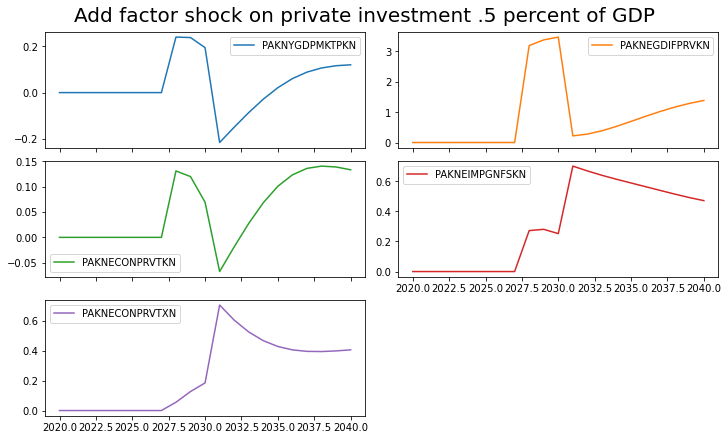

In [22]:
AFShockRes = mpak(AFShock,2020,2040,keep='1 % of GDP increase in FDI and private investment (AF shock)')
mpak['PAKNYGDPMKTPKN PAKNEGDIFPRVKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Add factor shock on private investment .5 percent of GDP")


## The keep option 

`ModelFlow`, standard pandas routines and other python libraries like **Matplotlib** and **Plotly** can be used to visualize and compare results, from scenarios -- as indeed has been done in the preceding paragraphs. 

The **Keep** option facilitates the comparison of results from different scenarios run on a give model object.  In each of the simulations executed above, the `keep` option was activated. This causes the results from each simulation in a unique `DataFrame` that can be identified by the descriptor given to it.  

Modelflfow has several special routines that allow results from kept scenarios to be displayed and compared.

### The `.keep_plot()` method

For example the keep_plot method can be used to plot the value, growth rate or percent change in levels of different values across from each of the kept solutions.


#### Differences of growth rates 

For example below we have graphs of the growth rates of GDP, Consumption and Imports from the four scenarios that we have run.

In [23]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN', diff=1,showtype='growth', legend=True)


{'PAKNYGDPMKTPCN': <Figure size 720x432 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 720x432 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 720x432 with 1 Axes>}

#### Differences in percent of baseline values

In this plot, the same results are presented, but as percent deviations from the baseline values of the displayed data.

In [24]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN', diffpct=1,showtype='level', legend=True);




### Some variations on keep_plot(

The **variables** we want to be displayed is listed as first argument. Variable names can include 
wildcards (using * for any string and ? for any character) 

**Transformation of data displayed:** 

| showtype= |Use this operator|
| :- | :---|
 'level' (default)|No transformation  
 'growth'| The growth rate  in percent 
 'change'| The yearly change ($\Delta$) 

**legend placement**

| legend= |Use this operator|
| :- | :---|
 False (default) |The legends are  placed at the end of the corresponding line
 True|The legends are places in a legend box


Often it is useful to compare the scenario results with the baseline result. This is done with the diff argument. 

| diff= |Use this operator|
| :- | :---|
 False (default) |All entries in the keep_solution dictionary is displayed
 True|The difference to the first entry is shown.

It can also be useful to compare the scenario results with the baseline result **measured in percent**. This is done with the diffpct argument. 

| diffpct= |Use this operator|
| :- | :---|
 False (default) |All entries in the keep_solution dictionary is displayed
 True|The difference in percent to the first entry is shown
 
 
 ```savefig='[path/]<prefix>.<extension>'```
 Will create a number of files with the charts.<br>
 The files will be saved location with name ```<path>/<prefix><variable name>.<extension>``` <br>The extension determines the 
 format of the saved file: ```pdf```, ```svg``` and ```png``` are the most common extensions. 

In [25]:
mpak.fix_dummy_fixed

[]

In [26]:
mpak['PAKNYGDPMKTPCN PAKNYGDPMKTPKN PAKGGEXPTOTLCN PAKGGREVTOTLCN PAKNECONGOVTKN']

In [27]:
mpak.keep_solutions.keys()


dict_keys(['Baseline', '$25 increase in oil prices 2025-27', '2.5% increase in C 2025-40', '2.5% increase in C 2025-27 -- exog whole period', '2.5% increase in C 2025-27 -- exog whole period --keep_growth=True', '2.5% increase in C 2025-27 -- temporarily exogenized', '1 % of GDP increase in FDI and private investment (AF shock)'])

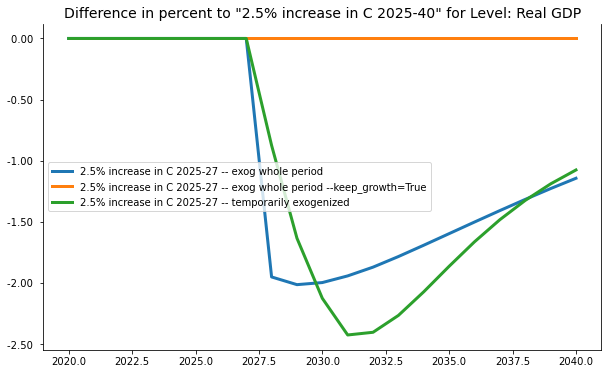

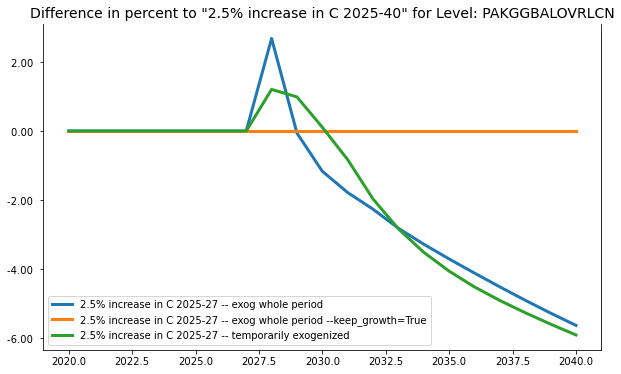

In [28]:
with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --keep_growth=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',diffpct=1,showtype='level',legend=True);